In [ ]:
!pip install umap-learn
!pip install hdbscan
!pip install mplcursors

In [ ]:
import h5py
import numpy as np
import pandas as pd
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from hdbscan import HDBSCAN
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from PIL import Image
import io
import torch
import torchvision.transforms as transforms
from IPython.display import display
from seaborn import heatmap
import seaborn as sns
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.decomposition import PCA

In [ ]:
def optimize_umap_hdbscan(
    wfeatures,
    param_grid,
    hdbscan_params=None,
    random_state=42
):
    """
    Grid-search over UMAP hyperparameters, measuring HDBSCAN clustering quality via silhouette score.

    Parameters:
    -----------
    wfeatures : np.ndarray of shape (N, d)
        High-dimensional feature vectors (e.g., from DINO).
    param_grid : list of dict
        Each dict should have keys that match UMAP's init arguments, e.g.:
        [{"n_neighbors": 5, "min_dist": 0.1}, {"n_neighbors": 10, "min_dist": 0.01}, ...]
    hdbscan_params : dict
        Parameters for HDBSCAN, e.g. {"min_cluster_size": 5, "min_samples": 5}.
    random_state : int
        Random seed for reproducible UMAP embeddings.

    Returns:
    --------
    best_embeddings : np.ndarray of shape (N, 2)
        The 2D UMAP embedding that yielded the best silhouette.
    best_labels : np.ndarray of shape (N,)
        The HDBSCAN labels for best embedding (label=-1 indicates noise).
    best_score : float
        The best silhouette score found.
    best_params : dict
        The UMAP hyperparameters that yielded the best score.
    """

    if hdbscan_params is None:
        hdbscan_params = {"min_cluster_size": 5, "min_samples": 5}

    # Scale features once
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(wfeatures)

    best_score = -1.0
    best_embeddings = None
    best_labels = None
    best_params = None

    for params in param_grid:
        # 1) Build UMAP with current params
        reducer = umap.UMAP(
            n_components=2,
            random_state=random_state,
            **params
        )

        # 2) Fit and transform
        embeddings = reducer.fit_transform(features_scaled)

        # 3) Cluster with HDBSCAN
        clusterer = HDBSCAN(**hdbscan_params)
        cluster_labels = clusterer.fit_predict(embeddings)

        # Check how many clusters (excluding noise)
        unique_clusters = set(cluster_labels) - {-1}
        if len(unique_clusters) < 2:
            # If we have 0 or 1 cluster (or all noise), silhouette is undefined.
            # We'll treat that as a poor fit and skip or set negative score.
            current_score = -999
        else:
            # Compute silhouette ignoring noise
            mask = (cluster_labels != -1)
            if np.sum(mask) < 2:
                current_score = -999
            else:
                current_score = silhouette_score(embeddings[mask], cluster_labels[mask])

        # 4) Keep track if it's the best so far
        if current_score > best_score:
            best_score = current_score
            best_embeddings = embeddings
            best_labels = cluster_labels
            best_params = params

        print(f"UMAP params={params}, #clusters={len(unique_clusters)}, silhouette={current_score:.3f}")

    print("\nBest silhouette:", best_score)
    print("Best params:", best_params)
    return best_embeddings, best_labels, best_score, best_params

In [ ]:
import umap
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler

def visualize_dino_features_umap(features, labels, n_neighbors=15, min_dist=0.1, random_state=42, figsize=(8, 6)):
    """
    Visualize DINO features using UMAP dimensionality reduction.

    Parameters:
    - features: numpy array of DINO features
    - labels: numpy array of corresponding labels
    - n_neighbors: UMAP parameter for local neighborhood size
    - min_dist: UMAP parameter for minimum distance between points
    - figsize: tuple for figure size

    Returns:
    - fig: matplotlib figure object
    - embeddings: UMAP embeddings
    """
    # Standardize features
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # Apply UMAP
    print("Computing UMAP embedding...")
    reducer = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        random_state=random_state,
        n_components=2
    )
    embeddings = reducer.fit_transform(features_scaled)

    # Create visualization
    plt.figure(figsize=figsize)

    # Create scatter plot
    scatter = plt.scatter(
        embeddings[:, 0],
        embeddings[:, 1],
        c=labels,
        cmap='viridis',
        alpha=0.6,
        s=50
    )

    # Add colorbar
    plt.colorbar(scatter, label='Event Label')

    # Add labels and title
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.title('UMAP Visualization of DINO Features')

    # Add grid
    plt.grid(True, alpha=0.3)

    # Add text box with statistics
    unique_labels, label_counts = np.unique(labels, return_counts=True)
    stats_text = "Label Distribution:\n"
    for label, count in zip(unique_labels, label_counts):
        stats_text += f"Label {label}: {count} events\n"

    plt.text(
        0.02, 0.98,
        stats_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.8),
        verticalalignment='top',
        fontsize=10
    )

    plt.tight_layout()
    plt.show()

    return plt.gcf(), embeddings

def analyze_clusters(embeddings, labels):
    """
    Analyze the separation of clusters in UMAP space.

    Parameters:
    - embeddings: UMAP embeddings array
    - labels: array of corresponding labels

    Returns:
    - dict with cluster statistics
    """
    stats = {}

    # Calculate cluster centers
    unique_labels = np.unique(labels)
    centers = {}
    for label in unique_labels:
        mask = labels == label
        centers[label] = embeddings[mask].mean(axis=0)

    # Calculate inter-cluster distances
    distances = {}
    for label1 in unique_labels:
        for label2 in unique_labels:
            if label1 < label2:
                dist = np.linalg.norm(centers[label1] - centers[label2])
                distances[f"{label1}-{label2}"] = dist

    # Calculate intra-cluster spread
    spreads = {}
    for label in unique_labels:
        mask = labels == label
        cluster_points = embeddings[mask]
        center = centers[label]
        spread = np.mean(np.linalg.norm(cluster_points - center, axis=1))
        spreads[label] = spread

    stats['centers'] = centers
    stats['inter_cluster_distances'] = distances
    stats['intra_cluster_spreads'] = spreads

    return stats

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_umap_embedding(embeddings, labels, figsize=(8, 6), title="UMAP Embedding"):
    """
    Plot a 2D UMAP embedding (already computed), coloring points by their labels.

    Parameters:
    - embeddings: (N, 2) array of UMAP coordinates
    - labels: 1D array of size N, with integer or float labels
    - figsize: tuple for figure size
    - title: string for the plot title
    """
    plt.figure(figsize=figsize)

    scatter = plt.scatter(
        embeddings[:, 0],
        embeddings[:, 1],
        c=labels,
        cmap='viridis',
        alpha=0.6,
        s=50
    )

    plt.colorbar(scatter, label='Labels')
    plt.xlabel('UMAP Dimension 1')
    plt.ylabel('UMAP Dimension 2')
    plt.title(title)
    plt.grid(True, alpha=0.3)

    # (Optional) show label distribution in text box
    unique_labels, label_counts = np.unique(labels, return_counts=True)
    stats_text = "Label Distribution:\n"
    for lbl, count in zip(unique_labels, label_counts):
        stats_text += f"Label {lbl}: {count} events\n"

    plt.text(
        0.02, 0.98,
        stats_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.8),
        verticalalignment='top',
        fontsize=10
    )

    plt.tight_layout()
    plt.show()

In [ ]:
import numpy as np
import torch
from scipy.ndimage import gaussian_filter

def prepare_hess_data(event_labels_df, image_size=224):
    """
    Prepares HESS event data with log-scale intensities,
    minimal smoothing, and no extra offset in final [0..1].
    """
    processed_events = []
    valid_labels = []

    for _, row in event_labels_df.iterrows():
        points_data = row['filtered_data']
        if points_data is None or len(points_data) == 0:
            continue

        # (x,y,intensity)
        positions = points_data[:, :2]
        intensities = points_data[:, 2]

        if len(positions) == 0:
            continue

        # 1) log scale
        log_intensities = np.log10(intensities + 1)
        # scale to [0..1]
        mn = log_intensities.min()
        mx = log_intensities.max()
        scaled_log_intensities = (log_intensities - mn) / (mx - mn) if mx > mn else log_intensities

        # 2) normalize XY
        pos_min = positions.min(axis=0)
        pos_max = positions.max(axis=0)
        pos_range = pos_max - pos_min
        if np.any(pos_range == 0):
            continue
        normalized_positions = (positions - pos_min) / pos_range

        # 3) create blank background = 0 => black
        image = np.zeros((image_size, image_size), dtype=np.float32)

        # 4) place intensities
        for (x, y), val in zip(normalized_positions, scaled_log_intensities):
            px = int(x * (image_size - 1))
            py = int(y * (image_size - 1))
            px = max(0, min(px, image_size - 1))
            py = max(0, min(py, image_size - 1))
            image[py, px] = val

        # 5) minimal smoothing
        image = gaussian_filter(image, sigma=0.3)

        # 6) per-image min-max => full [0..1] contrast
        img_min, img_max = image.min(), image.max()
        if img_max > img_min:
            image = (image - img_min) / (img_max - img_min)

        # Artificially amplify intensities (example factor = 5.0)
        image *= 150.0
        image = np.clip(image, 0, 1)  # Keep values in [0..1]

        # shape => (3,H,W)
        image_3ch = np.stack([image]*3, axis=0)
        image_tensor = torch.FloatTensor(image_3ch)

        processed_events.append(image_tensor)
        valid_labels.append(row['label'])

    if not processed_events:
        raise ValueError("No valid events found.")

    processed_images = torch.stack(processed_events)
    labels = torch.tensor(valid_labels)
    return processed_images, labels

In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors

def colorize_thumbnail(img_np):
    """
    img_np: shape (H, W, 3) in [0..255], but
            channels are duplicates => effectively (H,W) grayscale.
    We'll apply a 'viridis' colormap for better visibility.
    """
    # Convert to float [0..1]
    float_gray = img_np[..., 0].astype(np.float32) / 255.0  # use first channel
    # Apply a color map => returns RGBA in [0..1]
    rgba = cm.viridis(float_gray)
    # Convert RGBA => RGB in [0..255]
    rgb = (rgba[..., :3] * 255).astype(np.uint8)
    return rgb

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from scipy.ndimage import gaussian_filter
import torch
from torchvision import transforms

def visualize_processing_steps(event_row, image_size=224, sigma=0.8):
    """
    Visualize event data processing steps using enhanced log10 intensities.
    """
    points_data = event_row['filtered_data']
    if points_data is None or len(points_data) == 0:
        print("No valid data in this event")
        return

    positions = points_data[:, :2]
    intensities = points_data[:, 2]

    # Enhanced log scaling
    log_intensities = np.log10(intensities + 1)
    scaled_log_intensities = 2.0 * (log_intensities - log_intensities.min()) / (log_intensities.max() - log_intensities.min())

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    # 1. Original scatter plot with raw intensities using LogNorm
    scatter1 = axes[0].scatter(positions[:, 0], positions[:, 1],
                             c=intensities, cmap='viridis',
                             norm=LogNorm(vmin=max(intensities.min(), 1e-10), vmax=intensities.max()))
    axes[0].set_title('Original Point Cloud\n(Raw intensities)')
    axes[0].set_aspect('equal')
    axes[0].grid(True)
    plt.colorbar(scatter1, ax=axes[0])

    # 2. Scatter plot with enhanced log intensities
    scatter2 = axes[1].scatter(positions[:, 0], positions[:, 1],
                             c=scaled_log_intensities, cmap='viridis')
    axes[1].set_title('Point Cloud\n(Enhanced Log10 intensities)')
    axes[1].set_aspect('equal')
    axes[1].grid(True)
    plt.colorbar(scatter2, ax=axes[1])

    # 3. Raw image with enhanced log intensities
    raw_image = np.zeros((image_size, image_size))
    pos_min = positions.min(axis=0)
    pos_max = positions.max(axis=0)
    pos_range = pos_max - pos_min
    normalized_positions = (positions - pos_min) / pos_range

    for pos, intensity in zip(normalized_positions, scaled_log_intensities):
        x, y = pos
        px = int(x * (image_size - 1))
        py = int(y * (image_size - 1))
        px = max(0, min(px, image_size - 1))
        py = max(0, min(py, image_size - 1))
        raw_image[py, px] = intensity

    im3 = axes[2].imshow(raw_image, cmap='viridis', vmin=0, vmax=1)
    axes[2].set_title('Raw Image\n(Enhanced log intensities)')
    plt.colorbar(im3, ax=axes[2])

    # 4. Final smoothed and enhanced image
    smoothed_image = gaussian_filter(raw_image, sigma=sigma)

    # Enhance smoothed image
    image_min = smoothed_image.min()
    image_max = smoothed_image.max()
    if image_max > image_min:
        smoothed_image = (smoothed_image - image_min) / (image_max - image_min)
        smoothed_image = 0.8 * smoothed_image + 0.2  # Boost the signal

    smoothed_image = np.clip(smoothed_image, 0, 1)

    im4 = axes[3].imshow(smoothed_image, cmap='viridis', vmin=0, vmax=1)
    axes[3].set_title('Enhanced Smoothed Image')
    plt.colorbar(im4, ax=axes[3])

    plt.suptitle(f'Event Processing Steps (Label: {event_row["label"]})')
    plt.tight_layout()
    plt.show()

    # Show final RGB image
    image_3channel = np.stack([smoothed_image] * 3)
    image_tensor = torch.FloatTensor(image_3channel)

    plt.figure(figsize=(8, 8))
    plt.imshow(np.transpose(image_tensor.numpy(), (1, 2, 0)))
    plt.title('Final 3-Channel Image (DINO Input)')
    plt.colorbar(label='Intensity')
    plt.show()

In [ ]:
import torch
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from tqdm import tqdm

def extract_features(model, images, device='cuda', batch_size=32):
    """
    Extract features from images using DINOv2 model.

    Parameters:
    - model: Pre-trained DINOv2 model
    - images: Tensor of images (N, C, H, W)
    - device: Device to use for computation
    - batch_size: Batch size for feature extraction

    Returns:
    - features: numpy array of extracted features
    """
    model.eval()
    features = []

    with torch.no_grad():
        for i in tqdm(range(0, len(images), batch_size), desc="Extracting features"):
            batch = images[i:i + batch_size].to(device)
            batch_features = model(batch)
            features.append(batch_features.cpu().numpy())

    return np.vstack(features)

In [ ]:
def load_event_labels_from_hdf5(h5_file_path):
    """
    Load the event labels DataFrame from a saved HDF5 file.

    Parameters:
    - h5_file_path (str): Path to the HDF5 file (e.g., 'HESS_GammaLabels.h5').

    Returns:
    - event_labels_df (pd.DataFrame): A DataFrame with columns:
        ['eventnumber', 'label', 'filtered_data'].
      The 'filtered_data' column contains N×4 arrays:
      [posX, posY, intensity, cluster_label] for each event.
    """
    with h5py.File(h5_file_path, "r") as h5f:
        # Read top-level datasets
        eventnumbers = h5f["eventnumbers"][:]  # shape (N,)
        labels = h5f["labels"][:]              # shape (N,)

        # Prepare rows for the DataFrame
        rows = []

        filtered_data_group = h5f["filtered_data"]

        for i, eventnum in enumerate(eventnumbers):
            # Convert bytes to string if necessary
            if isinstance(eventnum, bytes):
                event_key = f"event_{eventnum.decode('utf-8')}"
                event_str = eventnum.decode('utf-8')
            else:
                event_key = f"event_{eventnum}"
                event_str = str(eventnum)

            # Retrieve label for this event
            lbl = labels[i]

            # Check if the event group exists under "filtered_data"
            if event_key in filtered_data_group:
                event_group = filtered_data_group[event_key]
                positions = event_group["positions"][:]       # shape (M, 2)
                intensities = event_group["intensities"][:]   # shape (M,)
                cluster_lbls = event_group["cluster_labels"][:]  # shape (M,)

                # Combine into (M, 4): [x, y, intensity, cluster_label]
                stacked = np.column_stack([positions, intensities, cluster_lbls])
            else:
                # If for some reason the group is missing, use an empty array
                stacked = np.array([])

            # Build the row dict
            row = {
                "eventnumber": event_str,
                "label": lbl,
                "filtered_data": stacked  # Nx4 array
            }
            rows.append(row)

    # Create a DataFrame with the required columns
    event_labels_df = pd.DataFrame(rows, columns=["eventnumber", "label", "filtered_data"])
    return event_labels_df

In [ ]:
# Mount Google Drive (if using Google Colab)
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def load_event_labels_from_hdf5_small(h5_file_path):
    """
    Load the event labels DataFrame from a saved HDF5 file.

    Parameters:
    - h5_file_path (str): Path to the HDF5 file (e.g., 'HESS_GammaLabels.h5').

    Returns:
    - event_labels_df (pd.DataFrame): A DataFrame with columns:
        ['eventnumber', 'label', 'filtered_data'].
      The 'filtered_data' column contains N×4 arrays:
      [posX, posY, intensity, cluster_label] for each event.
    """
    with h5py.File(h5_file_path, "r") as h5f:
        # Read top-level datasets
        eventnumbers = h5f["eventnumbers"][:]  # shape (N,)
        labels = h5f["labels"][:]              # shape (N,)

        # Prepare rows for the DataFrame
        rows = []

        for i, eventnum in enumerate(eventnumbers):
            # Convert bytes to string if necessary
            if isinstance(eventnum, bytes):
                event_key = f"event_{eventnum.decode('utf-8')}"
                event_str = eventnum.decode('utf-8')
            else:
                event_key = f"event_{eventnum}"
                event_str = str(eventnum)

            # Retrieve label for this event
            lbl = labels[i]

            # Build the row dict
            row = {
                "eventnumber": event_str,
                "label": lbl
            }
            rows.append(row)

    # Create a DataFrame with the required columns
    event_labels_df = pd.DataFrame(rows, columns=["eventnumber", "label"])
    return event_labels_df

In [ ]:
h5_small_file_path = "/content/drive/My Drive/HESS_GammaLabels(FINAL).h5"
event_labels_small_df = load_event_labels_from_hdf5_small(h5_small_file_path)
#print(event_labels_small_df.head())
#print(len(event_labels_small_df))
choose_events = event_labels_small_df["eventnumber"]
# Remove the 'event_' prefix using pandas' str.replace method
choose_events_cleaned = choose_events.str.replace('event_', '', regex=False)
choose_events_labels = event_labels_small_df["label"]

event_labels_df = pd.DataFrame({
    "eventnumber": choose_events_cleaned,
    "label": choose_events_labels
})

# Load the data file
file_path = "/content/drive/My Drive/HESS_Pixels_33746.out"
columns = [
    "eventnumber", "imagecounter", "WData_size", "telid",
    "charge_tel", "distance", "length_over_charge", "length", "width",
    "count", "pixelID", "intensity", "posX", "posY"
]
data = pd.read_csv(file_path, delim_whitespace=True, names=columns)

# Filter 'data' to include only chosen events
filtered_data = data[data['eventnumber'].isin(choose_events_cleaned)]

# Optional: Reset index if desired
# filtered_data = filtered_data.reset_index(drop=True)

filtered_data = filtered_data.drop([
    "imagecounter", "WData_size", "telid", "charge_tel", "distance",
    "length_over_charge", "length", "width", "count", "pixelID"
], axis=1)

# Merge the filtered_data with event_labels_df on 'eventnumber'
filtered_data = filtered_data.merge(event_labels_df, on="eventnumber", how="left")

# Display the first few rows to confirm
print(filtered_data.head())

<ipython-input-13-9f14fe6322e5>:22: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = pd.read_csv(file_path, delim_whitespace=True, names=columns)


  eventnumber  intensity    posX      posY  label
0     33746_4    71.0006 -0.1155  0.600155      0
1     33746_4    41.3006 -0.1365  0.563782      0
2     33746_4    39.8047 -0.0945  0.563782      0
3     33746_4    35.2063 -0.1575  0.600155      0
4     33746_4    30.1948 -0.1365  0.636528      0


In [ ]:
import numpy as np
from tqdm import tqdm

event_labels = []

# Group by 'eventnumber' so that we process all entries for each event together
for event_number, group in tqdm(filtered_data.groupby("eventnumber"), desc="Processing Events"):
    label = group["label"].iloc[0]  # Label should be the same for the entire group
    points = group[["posX", "posY"]].to_numpy()  # Extract (x, y) coordinates
    intensities = group["intensity"].to_numpy()  # Extract intensity values
    labeled_points = np.column_stack((points, intensities))  # Combine into an array

    event_labels.append({
        "eventnumber": event_number,
        "label": label,
        "filtered_data": labeled_points
    })

Processing Events: 100%|██████████| 2400/2400 [00:01<00:00, 2215.47it/s]


In [ ]:
event_labels_df = pd.DataFrame(event_labels)

In [ ]:
#h5_file_path = "/content/drive/My Drive/HESS_GammaLabels(600-finOK).h5"
#event_labels_df = load_event_labels_from_hdf5(h5_file_path)
#print(event_labels_df.head())
#print(len(event_labels_df))

In [ ]:
print(len(event_labels_df))

2400


In [ ]:
# Prepare data
print("Preparing data...")
processed_images, labels = prepare_hess_data(event_labels_df)

Preparing data...


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# **Zero-shot with Dinov2**

In [ ]:
# Load DINOv2 model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Loading DINOv2 model...")
dino_model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dino_model = dino_model.to(device)
dino_model.eval()

Loading DINOv2 model...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x NestedTensorBlock(
      (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (n

In [ ]:
# Extract features
print("Extracting features...")
dino_features = extract_features(dino_model, processed_images, device=device)

Extracting features...


Extracting features: 100%|██████████| 75/75 [00:10<00:00,  7.04it/s]


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Computing UMAP embedding...


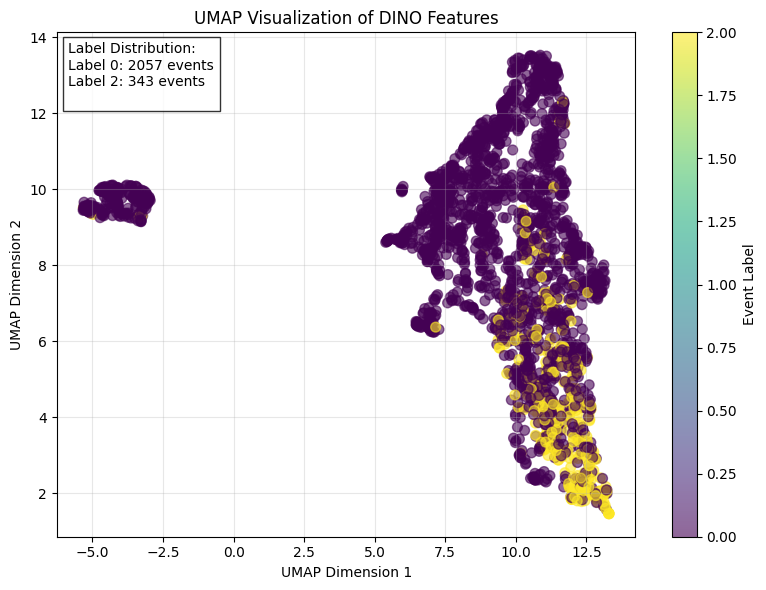

<Figure size 640x480 with 0 Axes>

In [ ]:
# Assuming you have already extracted DINO features
dino_fig, dino_embeddings = visualize_dino_features_umap(dino_features, labels)

# Analyze cluster statistics
cluster_stats = analyze_clusters(dino_embeddings, labels)

(2400, 10)


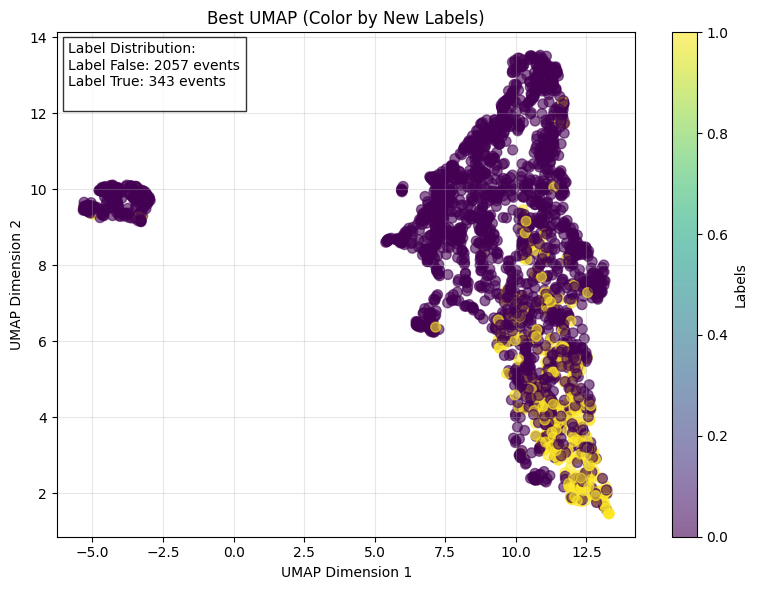

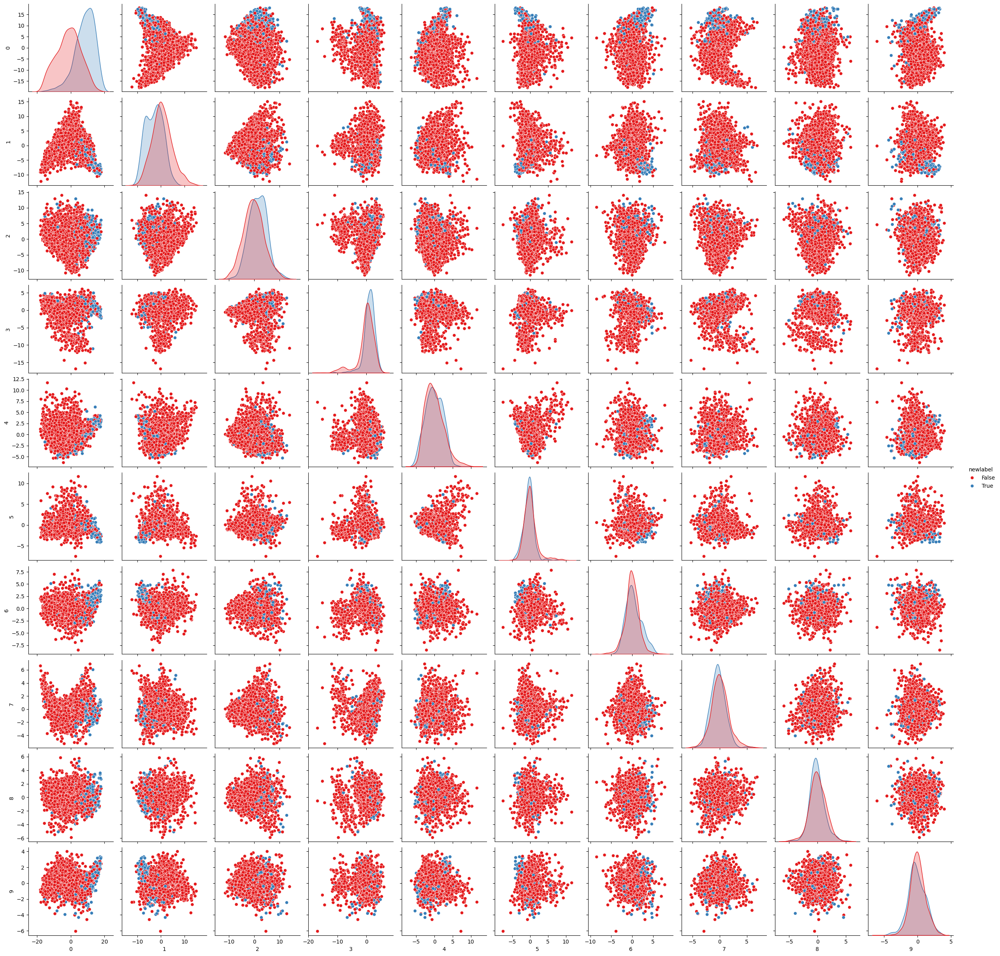

In [ ]:
pca = PCA(n_components=0.87)
pca_embeds = pca.fit_transform(dino_features)

print(pca_embeds.shape)

new_labels = (labels == 2)
visualize = pd.DataFrame(pca_embeds)
visualize['newlabel'] = new_labels

plot_umap_embedding(
    dino_embeddings,
    new_labels,
    title="Best UMAP (Color by New Labels)"
)

sns.pairplot(visualize,
             hue='newlabel',
             diag_kind='kde',
             diag_kws={'common_norm': False, 'common_grid': True},
             palette='Set1') # Spectral, coolwarm

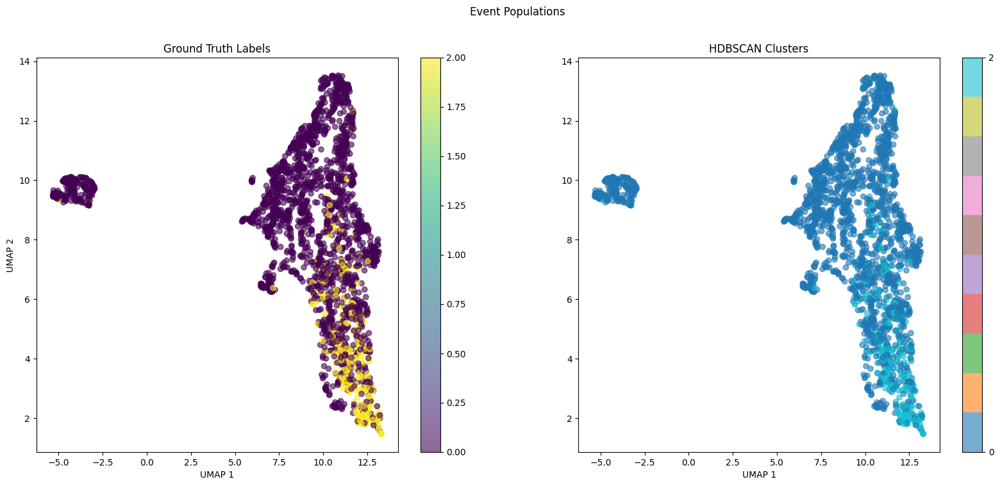

In [ ]:
def plot_enhanced_umap(embeddings, labels, cluster_labels, title="Event Populations"):
    """Visualize with both ground truth labels and cluster assignments"""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    # Ground truth labels
    scatter1 = ax1.scatter(embeddings[:, 0], embeddings[:, 1],
                          c=labels, cmap='viridis', alpha=0.6)
    ax1.set_title('Ground Truth Labels')
    ax1.set_xlabel('UMAP 1')
    ax1.set_ylabel('UMAP 2')
    plt.colorbar(scatter1, ax=ax1)

    # Cluster assignments
    unique_clusters = np.unique(cluster_labels)
    scatter2 = ax2.scatter(embeddings[:, 0], embeddings[:, 1],
                          c=cluster_labels, cmap='tab10', alpha=0.6)
    ax2.set_title('HDBSCAN Clusters')
    ax2.set_xlabel('UMAP 1')
    plt.colorbar(scatter2, ax=ax2, ticks=unique_clusters)

    plt.suptitle(title)
    plt.show()

# Usage
plot_enhanced_umap(dino_embeddings, labels.numpy(), labels)

In [ ]:
def convert_tensor_to_numpy(images_tensor):
    """
    Convert a PyTorch tensor to a NumPy array.

    Parameters:
    - images_tensor: shape (N,3,H,W) in float32 [0..1].

    Returns:
    - A NumPy array of shape (N,H,W,3) in uint8 [0..255].
    """
    img_np = images_tensor.cpu().numpy()  # Convert to NumPy
    img_np = (img_np * 255).clip(0,255).astype(np.uint8)  # Scale to 0-255
    img_np = np.transpose(img_np, (0,2,3,1))  # Change shape to (N,H,W,3)
    return img_np

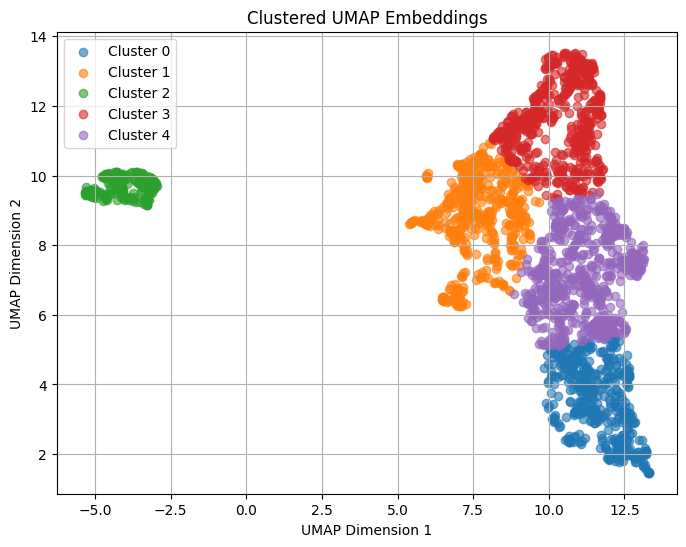

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

def cluster_and_visualize(embeddings, labels, n_clusters=5):
    """Cluster UMAP embeddings and visualize clusters."""
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embeddings)

    # Scatter plot with clusters
    plt.figure(figsize=(8, 6))
    for cluster in range(n_clusters):
        cluster_mask = cluster_labels == cluster
        plt.scatter(embeddings[cluster_mask, 0], embeddings[cluster_mask, 1], label=f"Cluster {cluster}", alpha=0.6)

    plt.title("Clustered UMAP Embeddings")
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    plt.legend()
    plt.grid(True)
    plt.show()

    return cluster_labels

# Example usage
cluster_labels = cluster_and_visualize(dino_embeddings, labels)

# **Fine Tuning**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import copy
from torch.utils.data import DataLoader, TensorDataset
import torchvision.transforms as T

In [ ]:
# Student: Strong augmentations (aug1)
aug1_transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5)
    #,T.RandomAffine(degrees=15, translate=(0.2, 0.2)),  # More aggressive spatial distortion
    #T.RandomApply([T.GaussianBlur(kernel_size=5)], p=0.5),
    #T.ColorJitter(brightness=0.3, contrast=0.3),       # Optional for grayscale
    #T.Lambda(lambda x: x + torch.randn_like(x) * 0.05) # Add noise
])

# Teacher: Mild augmentations (aug2)
aug2_transform = T.Compose([
    T.RandomHorizontalFlip(p=0.5)                     # Minimal spatial distortion
    #,T.RandomApply([T.GaussianBlur(kernel_size=3)], p=0.2),
    #T.Lambda(lambda x: x + torch.randn_like(x) * 0.01) # Very light noise
])

In [ ]:
###############################
# Create a projection head
###############################
temp_head = nn.Linear(384, 65536).to(device)  # e.g., 65536 output dim

###############################
# Define an optimizer
###############################
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, dino_model.parameters()),
    lr=1e-4
)

In [ ]:
def dino_loss(student_output, teacher_output, temp_s=0.1, temp_t=0.04):
    """
    Compute a simplified DINO self-distillation loss:
    - student_out: log-softmax (with temperature temp_s)
    - teacher_out: softmax (with temperature temp_t)
    """
    # student logits -> log-prob
    student_log_probs = F.log_softmax(student_output / temp_s, dim=-1)
    # teacher logits -> prob
    teacher_probs = F.softmax(teacher_output / temp_t, dim=-1)
    # cross-entropy
    loss = -(teacher_probs * student_log_probs).sum(dim=-1).mean()
    return loss

(array([2057.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
         343.]),
 array([0. , 0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ]),
 <BarContainer object of 10 artists>)

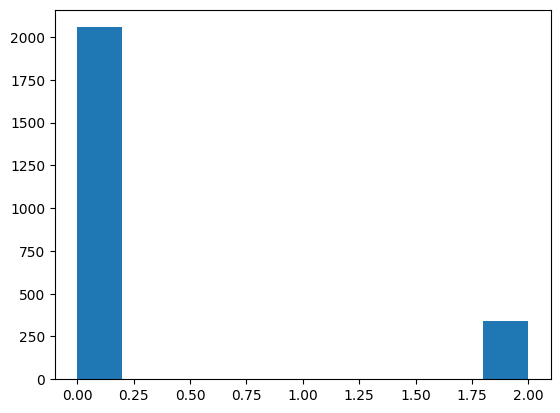

In [ ]:
plt.hist(event_labels_df['label'])

In [ ]:
# Get samples for both classes
class_2_filter = event_labels_df['label'] == 2
class_4_filter = event_labels_df['label'] != 2

# Get data for each class
class_2_data = event_labels_df[class_2_filter]
class_4_data = event_labels_df[class_4_filter]

# Find the minimum number of samples between the two classes
min_samples = min(len(class_2_data), len(class_4_data))

# Sample equal numbers from each class
class_2_balanced = class_2_data.sample(n=min_samples, random_state=42)
class_4_balanced = class_4_data.sample(n=min_samples, random_state=42)

# Combine the balanced datasets
balanced_data = pd.concat([class_2_balanced, class_4_balanced])

# Prepare the balanced data
gamma_images, gamma_labels = prepare_hess_data(class_2_balanced)

In [ ]:
from torch.utils.data import DataLoader, TensorDataset

train_loader_balanced = DataLoader(
    TensorDataset(gamma_images),  # no labels used
    batch_size=32,
    shuffle=True
)

train_loader_all = DataLoader(
    TensorDataset(processed_images),  # no labels used
    batch_size=32,
    shuffle=True
)

# train_loader = train_loader_balanced
train_loader = train_loader_all

In [ ]:
import copy

with torch.no_grad():
    teacher_model = copy.deepcopy(dino_model)
    teacher_head = copy.deepcopy(temp_head)
    for param in teacher_model.parameters():
        param.requires_grad = False
    for param in teacher_head.parameters():
        param.requires_grad = False

In [ ]:
for name, param in dino_model.blocks[11].named_parameters():
    print(name)

norm1.weight
norm1.bias
attn.qkv.weight
attn.qkv.bias
attn.proj.weight
attn.proj.bias
ls1.gamma
norm2.weight
norm2.bias
mlp.fc1.weight
mlp.fc1.bias
mlp.fc2.weight
mlp.fc2.bias
ls2.gamma


In [ ]:
import torch

# --- Freeze everything first ---
for param in dino_model.parameters():
    param.requires_grad = False

# Unfreeze blocks 10 and 11 in the dino_model
for block in dino_model.blocks[10:12]:  # Blocks 10 and 11
    for param in block.parameters():
        param.requires_grad = True

# If you also keep a projection head (temp_head), unfreeze that:
for param in temp_head.parameters():
    param.requires_grad = True

# Now only block11.mlp.* + temp_head have requires_grad=True.

In [ ]:
# List all unfrozen parameters in dino_model and temp_head
unfrozen_layers = []

# Check parameters in dino_model
for name, param in dino_model.named_parameters():
    if param.requires_grad:
        unfrozen_layers.append(name)

# Check parameters in temp_head (prefixed for clarity)
for name, param in temp_head.named_parameters():
    if param.requires_grad:
        unfrozen_layers.append(f"temp_head.{name}")

# Print results
print("Unfrozen Parameters/Layers:")
for layer in unfrozen_layers:
    print(layer)

Unfrozen Parameters/Layers:
blocks.10.norm1.weight
blocks.10.norm1.bias
blocks.10.attn.qkv.weight
blocks.10.attn.qkv.bias
blocks.10.attn.proj.weight
blocks.10.attn.proj.bias
blocks.10.ls1.gamma
blocks.10.norm2.weight
blocks.10.norm2.bias
blocks.10.mlp.fc1.weight
blocks.10.mlp.fc1.bias
blocks.10.mlp.fc2.weight
blocks.10.mlp.fc2.bias
blocks.10.ls2.gamma
blocks.11.norm1.weight
blocks.11.norm1.bias
blocks.11.attn.qkv.weight
blocks.11.attn.qkv.bias
blocks.11.attn.proj.weight
blocks.11.attn.proj.bias
blocks.11.ls1.gamma
blocks.11.norm2.weight
blocks.11.norm2.bias
blocks.11.mlp.fc1.weight
blocks.11.mlp.fc1.bias
blocks.11.mlp.fc2.weight
blocks.11.mlp.fc2.bias
blocks.11.ls2.gamma
temp_head.weight
temp_head.bias


In [ ]:
import time
import torchvision.transforms.functional as TF

epochs = 10
losses = []

print("Starting unsupervised fine-tuning of the last blocks...")

# Record overall start time
total_start_time = time.time()

dino_model.train()
for epoch in range(epochs):
    epoch_start_time = time.time()  # Start timing this epoch

    epoch_loss = 0.0
    for (batch_images,) in train_loader:
        batch_images = batch_images.to(device)

        ################################################
        #  (A) Create two differently augmented "views"
        ################################################
        aug_images1 = []
        aug_images2 = []
        for img in batch_images:
            # Move single image to CPU for transform
            img_cpu = img.cpu()

            # 1) Student augmentation
            pil_img1 = TF.to_pil_image(img_cpu)
            pil_img1 = aug1_transform(pil_img1)
            tensor1 = TF.to_tensor(pil_img1) + 0.001 * torch.randn_like(img_cpu)

            # 2) Teacher augmentation
            pil_img2 = TF.to_pil_image(img_cpu)
            pil_img2 = aug2_transform(pil_img2)
            tensor2 = TF.to_tensor(pil_img2) + 0.001 * torch.randn_like(img_cpu)

            aug_images1.append(tensor1)
            aug_images2.append(tensor2)

        aug_images1 = torch.stack(aug_images1).to(device)
        aug_images2 = torch.stack(aug_images2).to(device)

        ###############################################
        #  (B) Forward pass: Student
        ###############################################
        student_feats_dict = dino_model.forward_features(aug_images1)
        student_feats = student_feats_dict['x_norm_clstoken']
        student_output = temp_head(student_feats)

        ###############################################
        #  (C) Teacher forward pass (no grad)
        ###############################################
        with torch.no_grad():
            teacher_feats_dict = teacher_model.forward_features(aug_images2)
            teacher_feats = teacher_feats_dict['x_norm_clstoken']
            teacher_output = teacher_head(teacher_feats)

        ###############################################
        #  (D) Compute DINO loss
        ###############################################
        loss = dino_loss(student_output, teacher_output, temp_s=0.1, temp_t=0.04)

        ###############################################
        #  (E) Backprop on student
        ###############################################
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        ###############################################
        #  (F) Momentum update of teacher
        ###############################################
        with torch.no_grad():
            m = 0.996
            for param_s, param_t in zip(dino_model.parameters(), teacher_model.parameters()):
                param_t.data = param_t.data * m + param_s.data * (1.0 - m)
            for param_s, param_t in zip(temp_head.parameters(), teacher_head.parameters()):
                param_t.data = param_t.data * m + param_s.data * (1.0 - m)

        epoch_loss += loss.item() * batch_images.size(0)

    # Calculate average loss for this epoch
    avg_loss = epoch_loss / len(train_loader.dataset)
    losses.append(avg_loss)

    epoch_time = time.time() - epoch_start_time  # Time for this epoch
    print(f"Epoch [{epoch+1}/{epochs}] - Loss: {avg_loss:.4f} - Epoch time: {epoch_time:.2f}s")

total_time = time.time() - total_start_time
print(f"Unsupervised adaptation done! Total training time: {total_time:.2f}s")

Starting unsupervised fine-tuning of the last blocks...
Epoch [1/3] - Loss: 4.6604 - Epoch time: 39.05s
Epoch [2/3] - Loss: 0.4247 - Epoch time: 39.00s
Epoch [3/3] - Loss: 0.3568 - Epoch time: 38.32s
Unsupervised adaptation done! Total training time: 116.37s


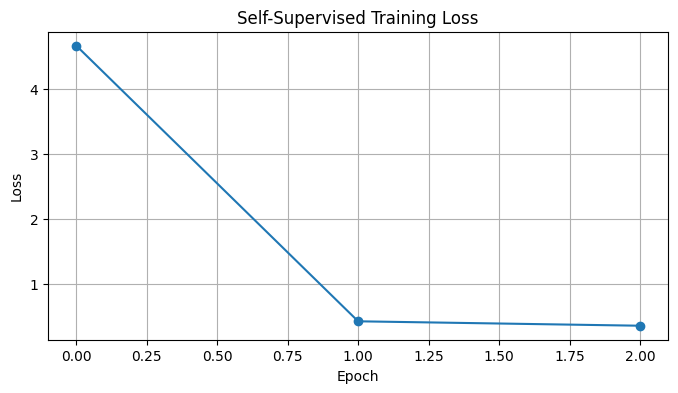

In [ ]:
plt.figure(figsize=(8,4))
plt.plot(losses, marker='o')
plt.title('Self-Supervised Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.show()

In [ ]:
def custom_extract_finetuned_features(dino_model, images, device='cuda', batch_size=32):
    """
    Extract x_norm_clstoken from a partially fine-tuned DINO model.
    """
    dino_model.eval()
    all_feats = []

    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i+batch_size].to(device)
            feats_dict = dino_model.forward_features(batch)
            feats = feats_dict['x_norm_clstoken']  # shape (batch_size, 384)
            all_feats.append(feats.cpu().numpy())

    return np.vstack(all_feats)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:

UMAP params={'n_neighbors': 5, 'min_dist': 0.1}, #clusters=64, silhouette=0.535


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP params={'n_neighbors': 5, 'min_dist': 0.2}, #clusters=3, silhouette=0.422


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP params={'n_neighbors': 5, 'min_dist': 0.3}, #clusters=3, silhouette=0.366


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP params={'n_neighbors': 15, 'min_dist': 0.1}, #clusters=2, silhouette=0.574


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


UMAP params={'n_neighbors': 15, 'min_dist': 0.2}, #clusters=2, silhouette=0.540


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP params={'n_neighbors': 15, 'min_dist': 0.3}, #clusters=2, silhouette=0.456

Best silhouette: 0.57361114
Best params: {'n_neighbors': 15, 'min_dist': 0.1}


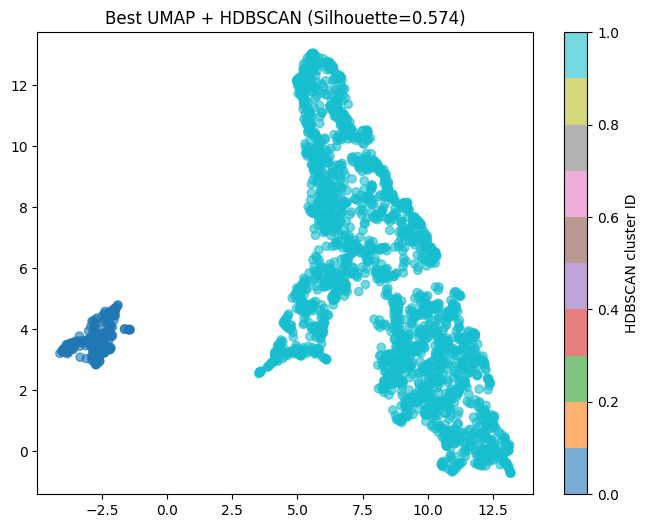

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [ ]:
# Then do:
fine_tuned_features = custom_extract_finetuned_features(dino_model, processed_images, device=device)

# 1) Run the optimization
param_grid = [
    {"n_neighbors": 5, "min_dist": 0.1},
    {"n_neighbors": 5, "min_dist": 0.2},
    {"n_neighbors": 5, "min_dist": 0.3},
    {"n_neighbors": 15, "min_dist": 0.1},
    {"n_neighbors": 15, "min_dist": 0.2},
    {"n_neighbors": 15, "min_dist": 0.3}
]

best_embeds, best_labels, best_score, best_params = optimize_umap_hdbscan(
    fine_tuned_features,
    param_grid=param_grid,
    hdbscan_params={"min_cluster_size": 10, "min_samples": 5},
    random_state=42
)

# 2) Plot the best embedding + cluster results
plt.figure(figsize=(8, 6))
scatter = plt.scatter(best_embeds[:, 0], best_embeds[:, 1],
                      c=best_labels, cmap='tab10', alpha=0.6)
plt.title(f"Best UMAP + HDBSCAN (Silhouette={best_score:.3f})")
plt.colorbar(scatter, label="HDBSCAN cluster ID")
plt.show()

# If you also want to color by your original 'labels',
# re-run the best UMAP (umap.UMAP(**best_params)) then color by 'labels':
umap_reducer = umap.UMAP(**best_params, random_state=42)
scaler = StandardScaler()
feat_scaled = scaler.fit_transform(fine_tuned_features)
final_embeds = umap_reducer.fit_transform(feat_scaled)

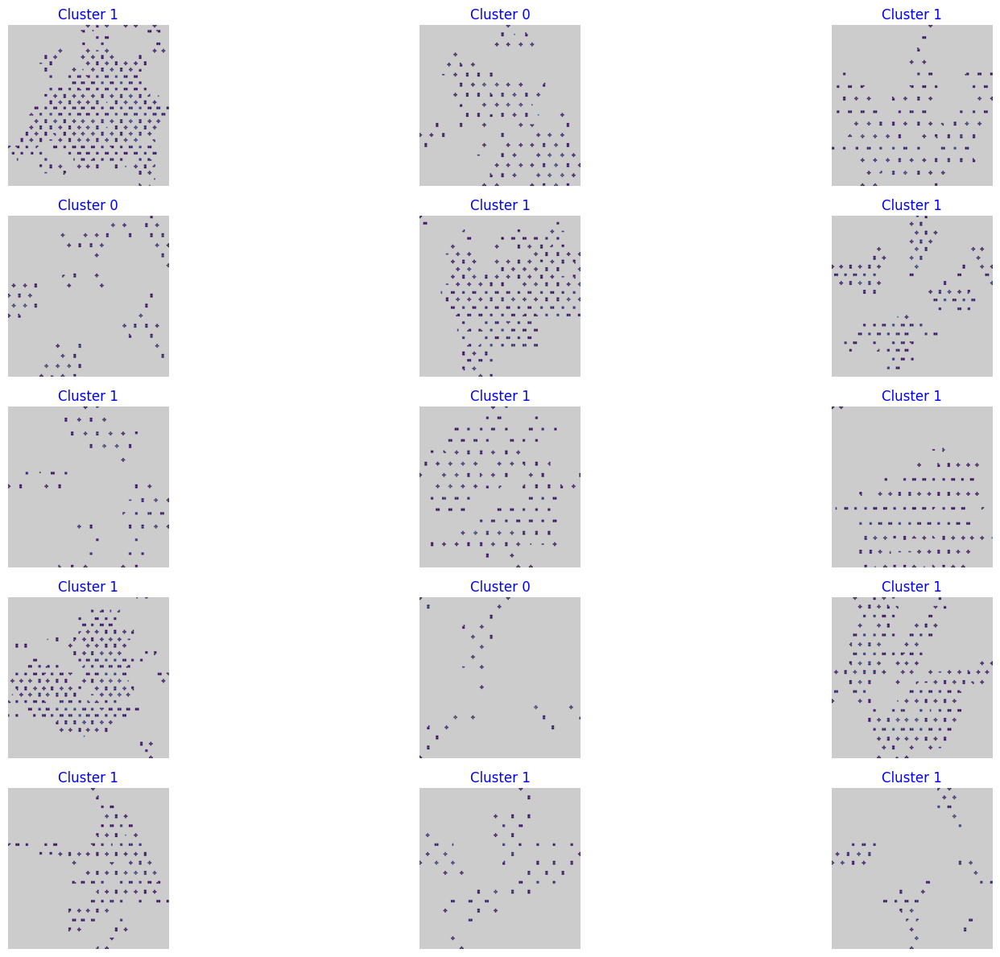

In [ ]:
import cv2

def resize_to_fixed_size(img, target=128):
    """ Resize image to fixed dimensions. """
    return cv2.resize(img, (target, target), interpolation=cv2.INTER_AREA)

def make_thumbnail(img, out_size=128, apply_colormap=True):
    """ Create a thumbnail from an image with optional colormap application. """
    resized = resize_to_fixed_size(img, out_size)
    if not apply_colormap:
        return resized if resized.ndim == 3 else np.stack([resized]*3, axis=-1)
    gray = resized[..., 0] if resized.ndim == 3 else resized
    rgba = cm.viridis(gray.astype(np.float32) / 255.0)
    rgba[..., :3][gray == 0] = [0.8, 0.8, 0.8]  # Change background to light grey (RGB [204, 204, 204])
    return (rgba[..., :3] * 255).astype(np.uint8)

def display_images(images, labels, ncols=3, figsize=(18, 12)):
    """ Display fewer images in a grid format with larger thumbnails and HDBSCAN labels. """
    n_images = len(images)
    nrows = (n_images + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
    axes = axes.flatten()
    for ax, img, label in zip(axes, images, labels):
        ax.imshow(img)
        ax.set_title(f"Cluster {label}", fontsize=12, color="blue")
        ax.axis('off')
    for ax in axes[n_images:]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Convert processed images to NumPy format
images_np = convert_tensor_to_numpy(processed_images)

# Generate thumbnails
final_images = [make_thumbnail(img) for img in images_np]

# Display fewer images with larger thumbnails and HDBSCAN labels
display_images(final_images[:15], best_labels[:15])

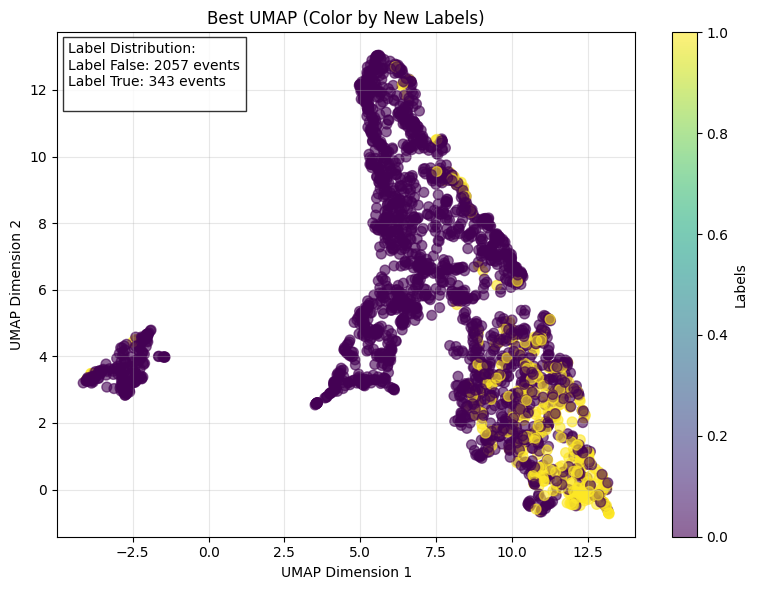

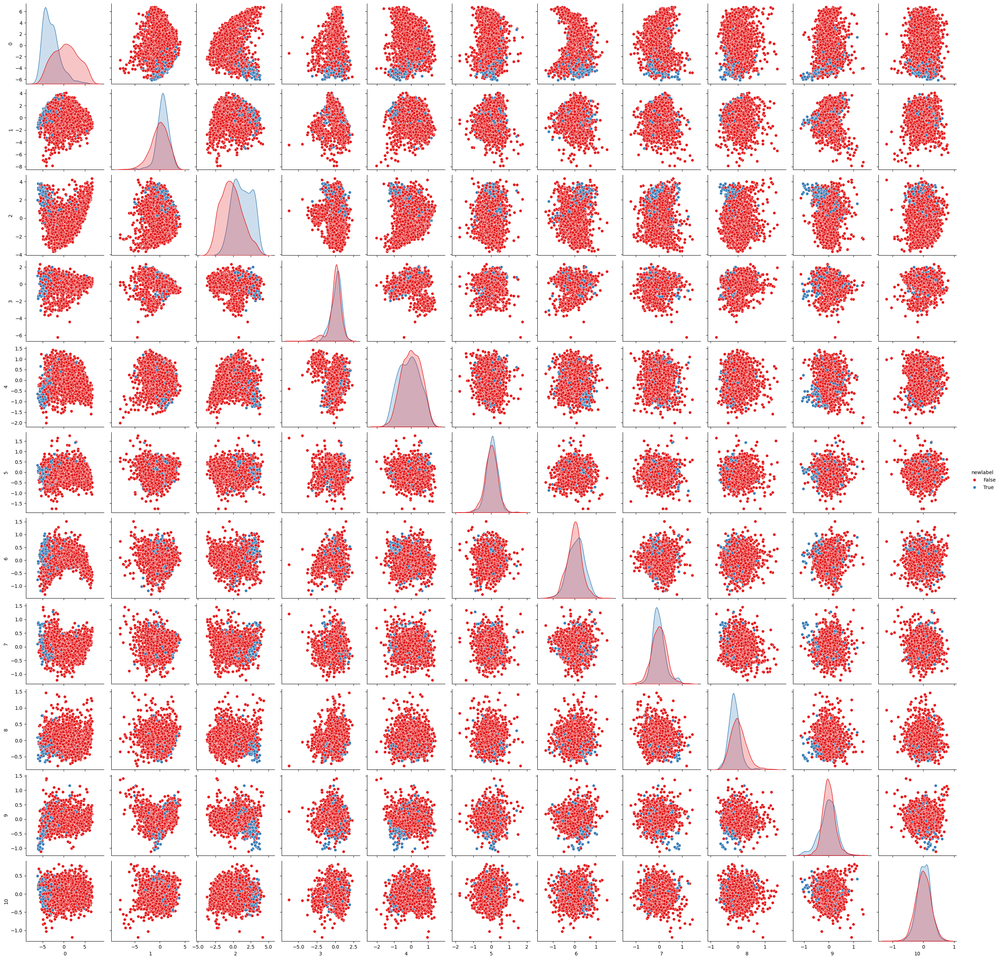

In [ ]:
pca = PCA(n_components=0.96)
pca_embeds = pca.fit_transform(fine_tuned_features)
new_labels = (labels == 2)
visualize = pd.DataFrame(pca_embeds)
visualize['newlabel'] = new_labels
#print(len(best_embeds), len(labels))
plot_umap_embedding(
    best_embeds,
    new_labels,
    title="Best UMAP (Color by New Labels)"
)
sns.pairplot(visualize,
             hue='newlabel',
             diag_kind='kde',
             diag_kws={'common_norm': False, 'common_grid': True},
             palette='Set1') # Spectral, coolwarm

In [ ]:
# processed_images, labels
fine_tuned_features_all = custom_extract_finetuned_features(dino_model, processed_images, device=device)

pca_all = PCA(n_components=0.87)
pca_embeds_all = pca.fit_transform(fine_tuned_features_all)
new_labels_all = (labels == 2)
visualize_all = pd.DataFrame(pca_embeds_all)
visualize_all['newlabel'] = new_labels_all
#print(len(best_embeds), len(labels))

In [ ]:
# 1) Run the optimization
param_grid = [
    {"n_neighbors": 5, "min_dist": 0.1},
    {"n_neighbors": 5, "min_dist": 0.2},
    {"n_neighbors": 5, "min_dist": 0.3},
    {"n_neighbors": 15, "min_dist": 0.1},
    {"n_neighbors": 15, "min_dist": 0.2},
    {"n_neighbors": 15, "min_dist": 0.3}
]

best_embeds_all, best_labels_all, best_score_all, best_params_all = optimize_umap_hdbscan(
    fine_tuned_features_all,
    param_grid=param_grid,
    hdbscan_params={"min_cluster_size": 10, "min_samples": 5},
    random_state=42
)

# 2) Plot the best embedding + cluster results
plt.figure(figsize=(8, 6))
scatter_all = plt.scatter(best_embeds_all[:, 0], best_embeds_all[:, 1],
                      c=best_labels_all, cmap='tab10', alpha=0.6)
plt.title(f"Best UMAP + HDBSCAN (Silhouette={best_score:.3f})")
plt.colorbar(scatter_all, label="HDBSCAN cluster ID")
plt.show()

# If you also want to color by your original 'labels',
# re-run the best UMAP (umap.UMAP(**best_params)) then color by 'labels':
umap_reducer = umap.UMAP(**best_params_all, random_state=42)
scaler = StandardScaler()
feat_scaled_all = scaler.fit_transform(fine_tuned_features_all)
final_embeds_all = umap_reducer.fit_transform(feat_scaled_all)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


KeyboardInterrupt: 

In [ ]:
plot_umap_embedding(
    best_embeds,
    new_labels,
    title="Best UMAP (Color by New Labels)"
)
sns.pairplot(visualize,
             hue='newlabel',
             diag_kind='kde',
             diag_kws={'common_norm': False, 'common_grid': True},
             palette='Set1') # Spectral, coolwarm

In [ ]:
import numpy as np
import torch
import pandas as pd
from scipy.ndimage import gaussian_filter, binary_dilation, maximum_filter

def prepare_hess_data_with_dilation(
    event_labels_df: pd.DataFrame,
    image_size: int = 224,
    smoothing_sigma: float = 0.0,
    dilation_threshold: float = 0.1,
    dilation_kernel_size: int = 3,
    dilation_iterations: int = 1,
    intensity_multiplier: float = 5.0
):
    """
    Prepares HESS event data with these steps:
      1) Log-scale + min–max for intensities
      2) Place them into a 2D image (background=0)
      3) (Optional) Gaussian smoothing
      4) Morphological dilation to enlarge hits above threshold
      5) Local max within dilation region (so the intensities spread)
      6) Per-image min–max => [0..1] plus optional multiplier
      7) Stacked as (3,H,W) and returned as a torch.Tensor

    Parameters:
    -----------
    event_labels_df : pd.DataFrame
        Must contain a 'filtered_data' column with (x, y, intensity, cluster_label).
    image_size : int
        The width/height of the final square image array.
    smoothing_sigma : float
        How much Gaussian smoothing to apply (0 => none).
    dilation_threshold : float
        Pixel threshold above which we consider it a "hit" to be dilated.
    dilation_kernel_size : int
        The width/height of the structuring element for binary_dilation.
    dilation_iterations : int
        How many times to apply the dilation.
    intensity_multiplier : float
        Final multiplier after min–max to brighten hits further.

    Returns:
    --------
    processed_images : torch.Tensor of shape (N, 3, H, W)
    labels : torch.Tensor of shape (N,)

    Usage:
    ------
        processed_images, labels = prepare_hess_data_with_dilation(event_labels_df)
    """
    processed_events = []
    valid_labels = []

    struct = np.ones((dilation_kernel_size, dilation_kernel_size), dtype=bool)

    for _, row in event_labels_df.iterrows():
        points_data = row.get("filtered_data", None)
        if points_data is None or len(points_data) == 0:
            continue

        positions = points_data[:, :2]  # (x,y)
        intensities = points_data[:, 2]
        if len(positions) == 0:
            continue

        # 1) Log scale intensities + min–max
        log_intensities = np.log10(intensities + 1)
        min_log, max_log = log_intensities.min(), log_intensities.max()
        if max_log > min_log:
            scaled_intensities = (log_intensities - min_log) / (max_log - min_log)
        else:
            scaled_intensities = log_intensities  # fallback if all same

        # 2) Normalize positions => [0..1]
        pos_min = positions.min(axis=0)
        pos_max = positions.max(axis=0)
        pos_range = pos_max - pos_min
        if np.any(pos_range == 0):
            continue
        norm_pos = (positions - pos_min) / pos_range

        # 3) Build a 2D array, place scaled intensities
        image = np.zeros((image_size, image_size), dtype=np.float32)
        for (x, y), val in zip(norm_pos, scaled_intensities):
            px = int(x*(image_size-1))
            py = int(y*(image_size-1))
            image[py, px] = val

        # (Optional) smoothing
        if smoothing_sigma > 0.0:
            image = gaussian_filter(image, sigma=smoothing_sigma)

        # 4) Morphological dilation for hits >= dilation_threshold
        mask = (image >= dilation_threshold)
        dilated_mask = binary_dilation(
            mask,
            structure=struct,
            iterations=dilation_iterations
        )

        # 5) local maximum in the neighborhood => spread intensities
        #    so each newly dilated pixel inherits the local max
        localmax = maximum_filter(image, size=dilation_kernel_size)
        image = np.where(dilated_mask, localmax, image)

        # 6) Per-image min–max => [0..1], plus multiplier
        mn_val, mx_val = image.min(), image.max()
        if mx_val > mn_val:
            image = (image - mn_val) / (mx_val - mn_val)

        if intensity_multiplier != 1.0:
            image *= intensity_multiplier
            np.clip(image, 0, 1, out=image)

        # shape => (3,H,W)
        image_3ch = np.stack([image]*3, axis=0)
        image_tensor = torch.FloatTensor(image_3ch)

        processed_events.append(image_tensor)
        valid_labels.append(row["label"])

    if not processed_events:
        raise ValueError("No valid events found after processing.")

    processed_images = torch.stack(processed_events)
    labels = torch.tensor(valid_labels, dtype=torch.long)
    return processed_images, labels

In [ ]:
gamma_images, gamma_labels = prepare_hess_data_with_dilation(
    event_labels_df[event_labels_df['label']==2],
    image_size=224,
    smoothing_sigma=0.0,        # disable smoothing if your hits are very faint
    dilation_threshold=0.1,     # decide how bright a pixel must be to be dilated
    dilation_kernel_size=3,     # or 5 if you want bigger spread
    dilation_iterations=1,      # more iterations => bigger hits
    intensity_multiplier=70.0   # amplify final intensities
)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
import matplotlib.cm as cm

###############################################################################
# 1) Helper to convert tensor => numpy [0..255]
###############################################################################
def convert_tensor_to_numpy(images_tensor):
    """
    images_tensor: shape (N,3,H,W) in float32 [0..1].
    Returns shape (N,H,W,3) in uint8 [0..255].
    """
    img_np = images_tensor.cpu().numpy()  # shape (N,3,H,W)
    img_np = (img_np * 255).clip(0,255).astype(np.uint8)
    img_np = np.transpose(img_np, (0,2,3,1))  # => (N,H,W,3)
    return img_np

###############################################################################
# 2) Crop out empty background
###############################################################################
def crop_nonempty_region(img, threshold=0.01, margin=2):
    """
    Finds the bounding box of pixels >= threshold (in [0..1] or [0..255]).
    Crops to that bounding box, plus some margin.
    Returns None if entire image is below threshold.
    """
    # if 3-channel, convert to single channel for bounding box
    if img.ndim == 3 and img.shape[2] == 3:
        gray = img[...,0]  # or take mean across channels
    else:
        gray = img

    # if in [0..255], convert to float in [0..1]
    if gray.dtype == np.uint8:
        gray_float = gray.astype(np.float32)/255.0
    else:
        gray_float = gray

    mask = (gray_float >= threshold)
    coords = np.argwhere(mask)
    if len(coords) == 0:
        return None  # no non-empty pixels

    y_min, x_min = coords.min(axis=0)
    y_max, x_max = coords.max(axis=0)

    # add margin
    y_min = max(0, y_min - margin)
    x_min = max(0, x_min - margin)
    y_max = min(img.shape[0]-1, y_max + margin)
    x_max = min(img.shape[1]-1, x_max + margin)

    if img.ndim == 3:
        return img[y_min:y_max+1, x_min:x_max+1, :]
    else:
        return img[y_min:y_max+1, x_min:x_max+1]

###############################################################################
# 3) Resize to a fixed dimension
###############################################################################
def resize_to_fixed_size(img, target=64):
    """
    Resizes img to shape (target, target) or (target, target, 3).
    Uses OpenCV INTER_AREA for better downsampling.
    """
    H, W = img.shape[:2]
    return cv2.resize(img, (target, target), interpolation=cv2.INTER_AREA)

###############################################################################
# 4) Build a final thumbnail with optional color map
###############################################################################
def make_thumbnail(img, threshold=0.01, margin=2, out_size=64, apply_colormap=True):
    """
    1) Crop out empty background (< threshold).
    2) Resize to out_size×out_size.
    3) Optionally apply colormap (viridis).
    Returns a final (out_size, out_size, 3) in uint8 [0..255],
    or None if entire image is below threshold.
    """
    #cropped = crop_nonempty_region(img, threshold=threshold, margin=margin)
    #if cropped is None:
    #    return None  # no data
    resized = resize_to_fixed_size(img, out_size)

    if not apply_colormap:
        # if single channel => expand
        if resized.ndim == 2:
            resized_3ch = np.stack([resized]*3, axis=-1)
            return resized_3ch.astype(np.uint8)
        return resized

    # Apply colormap:
    # if resized is shape (H,W,3) then channels are duplicates => pick channel0
    gray = resized[...,0] if resized.ndim == 3 else resized
    # convert to float [0..1]
    gray_float = gray.astype(np.float32)/255.0
    rgba = cm.viridis(gray_float)  # shape (H,W,4)
    rgb = (rgba[...,:3]*255).astype(np.uint8)
    return rgb

###############################################################################
# 5) Plot thumbnails on UMAP
###############################################################################
def plot_thumbnails_on_umap(embeds, thumbs, zoom=1.0, figsize=(18,18)):
    """
    Overlays each thumbnail from 'thumbs' onto (x,y) from 'embeds'.
    thumbs[i] can be None if no data was found.
    """
    fig, ax = plt.subplots(figsize=figsize)
    ax.scatter(embeds[:,0], embeds[:,1], alpha=0.0)  # invisible points

    for (x, y), thumb in zip(embeds, thumbs):
        if thumb is None:
            continue
        oi = OffsetImage(thumb, zoom=zoom)
        ab = AnnotationBbox(oi, (x, y), frameon=False)
        ax.add_artist(ab)

    ax.set_title("UMAP with Thumbnails (Downsampled & Cropped)")
    plt.grid(True, alpha=0.3)
    plt.show()

###############################################################################
# Example Usage in your code
###############################################################################

# 1) Convert your processed images to N,H,W,3 in [0..255]
images_np = convert_tensor_to_numpy(processed_images)

# 2) Suppose 'embeddings' shape is (N,2). Downsample
def downsample_data(embeds, imgs, k=200, random_state=42):
    N = len(embeds)
    if k >= N:
        return embeds, imgs
    rng = np.random.default_rng(random_state)
    idx = rng.choice(N, size=k, replace=False)
    return embeds[idx], imgs[idx]

sub_embeds, sub_imgs = downsample_data(best_embeds, images_np, k=50)

# 3) Build final cropped & colorized thumbnails
final_thumbs = []
for img in sub_imgs:
    thumb = make_thumbnail(img, threshold=0.05, margin=2, out_size=64, apply_colormap=True)
    final_thumbs.append(thumb)

# 4) Plot
plot_thumbnails_on_umap(sub_embeds, final_thumbs, zoom=2.5)